# **1. Perkenalan Dataset**


Tahap pertama, Anda harus mencari dan menggunakan dataset **tanpa label** dengan ketentuan sebagai berikut:

1. **Sumber Dataset**:  
   Dataset dapat diperoleh dari berbagai sumber, seperti public repositories (*Kaggle*, *UCI ML Repository*, *Open Data*) atau data primer yang Anda kumpulkan sendiri.
   
2. **Ketentuan Dataset**:
   - **Tanpa label**: Dataset tidak boleh memiliki label atau kelas.
   - **Jumlah Baris**: Minimal 1000 baris untuk memastikan dataset cukup besar untuk analisis yang bermakna.
   - **Tipe Data**: Harus mengandung data **kategorikal** dan **numerikal**.
     - *Kategorikal*: Misalnya jenis kelamin, kategori produk.
     - *Numerikal*: Misalnya usia, pendapatan, harga.

3. **Pembatasan**:  
   Dataset yang sudah digunakan dalam latihan clustering (seperti customer segmentation) tidak boleh digunakan.

# **2. Import Library**

Pada tahap ini, Anda perlu mengimpor beberapa pustaka (library) Python yang dibutuhkan untuk analisis data dan pembangunan model machine learning.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import sklearn

# **3. Memuat Dataset**

Pada tahap ini, Anda perlu memuat dataset ke dalam notebook. Jika dataset dalam format CSV, Anda bisa menggunakan pustaka pandas untuk membacanya. Pastikan untuk mengecek beberapa baris awal dataset untuk memahami strukturnya dan memastikan data telah dimuat dengan benar.

Jika dataset berada di Google Drive, pastikan Anda menghubungkan Google Drive ke Colab terlebih dahulu. Setelah dataset berhasil dimuat, langkah berikutnya adalah memeriksa kesesuaian data dan siap untuk dianalisis lebih lanjut.

In [2]:
import pandas as pd

df_health = pd.read_csv("data/mental_health_analysis.csv")
df_health.head()

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance
0,1,16,F,9.654486,2.458001,5.198926,8.158189,3,0.288962,Moderate,Excellent
1,2,17,M,9.158143,0.392095,8.866097,5.151993,5,0.409446,Moderate,Good
2,3,15,M,5.028755,0.520119,4.943095,9.209325,2,0.423837,Moderate,Poor
3,4,17,F,7.951103,1.022630,5.262773,9.823658,5,0.666021,Moderate,Average
4,5,17,F,1.357459,1.225462,6.196080,11.338990,5,0.928060,High,Poor


In [3]:
# Menampilkan ringkasan informasi dari dataset
df_health.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   User_ID                5000 non-null   int64  
 1   Age                    5000 non-null   int64  
 2   Gender                 5000 non-null   object 
 3   Social_Media_Hours     5000 non-null   float64
 4   Exercise_Hours         5000 non-null   float64
 5   Sleep_Hours            5000 non-null   float64
 6   Screen_Time_Hours      5000 non-null   float64
 7   Survey_Stress_Score    5000 non-null   int64  
 8   Wearable_Stress_Score  5000 non-null   float64
 9   Support_System         5000 non-null   object 
 10  Academic_Performance   5000 non-null   object 
dtypes: float64(5), int64(3), object(3)
memory usage: 429.8+ KB


In [4]:
# Menampilkan statistik deskriptif dari dataset
df_health.describe(include="all")

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance
count,5000.000000,5000.000000,5000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000,5000
unique,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,3,4
top,NaN,NaN,F,NaN,NaN,NaN,NaN,NaN,NaN,Moderate,Poor
freq,NaN,NaN,2528,NaN,NaN,NaN,NaN,NaN,NaN,1696,1293
mean,2500.500000,15.493200,NaN,4.932081,1.498151,7.057370,7.068630,3.015800,0.496618,NaN,NaN
std,1443.520003,1.715151,NaN,2.853928,0.873984,1.722211,2.883494,1.414762,0.289768,NaN,NaN
min,1.000000,13.000000,NaN,0.000528,0.000473,4.001515,2.000481,1.000000,0.000102,NaN,NaN
25%,1250.750000,14.000000,NaN,2.473150,0.734431,5.611836,4.574327,2.000000,0.244615,NaN,NaN
50%,2500.500000,16.000000,NaN,4.898176,1.483432,7.068874,7.118979,3.000000,0.500404,NaN,NaN
75%,3750.250000,17.000000,NaN,7.369195,2.276089,8.519411,9.526335,4.000000,0.749929,NaN,NaN


In [5]:
print(df_health.isna().sum())  # Cek missing values
print((df_health == "").sum())  # Cek string kosong sebagai missing values

User_ID                  0
Age                      0
Gender                   0
Social_Media_Hours       0
Exercise_Hours           0
Sleep_Hours              0
Screen_Time_Hours        0
Survey_Stress_Score      0
Wearable_Stress_Score    0
Support_System           0
Academic_Performance     0
dtype: int64
User_ID                  0
Age                      0
Gender                   0
Social_Media_Hours       0
Exercise_Hours           0
Sleep_Hours              0
Screen_Time_Hours        0
Survey_Stress_Score      0
Wearable_Stress_Score    0
Support_System           0
Academic_Performance     0
dtype: int64


# **4. Exploratory Data Analysis (EDA)**

Pada tahap ini, Anda akan melakukan **Exploratory Data Analysis (EDA)** untuk memahami karakteristik dataset. EDA bertujuan untuk:

1. **Memahami Struktur Data**
   - Tinjau jumlah baris dan kolom dalam dataset.  
   - Tinjau jenis data di setiap kolom (numerikal atau kategorikal).

2. **Menangani Data yang Hilang**  
   - Identifikasi dan analisis data yang hilang (*missing values*). Tentukan langkah-langkah yang diperlukan untuk menangani data yang hilang, seperti pengisian atau penghapusan data tersebut.

3. **Analisis Distribusi dan Korelasi**  
   - Analisis distribusi variabel numerik dengan statistik deskriptif dan visualisasi seperti histogram atau boxplot.  
   - Periksa hubungan antara variabel menggunakan matriks korelasi atau scatter plot.

4. **Visualisasi Data**  
   - Buat visualisasi dasar seperti grafik distribusi dan diagram batang untuk variabel kategorikal.  
   - Gunakan heatmap atau pairplot untuk menganalisis korelasi antar variabel.

Tujuan dari EDA adalah untuk memperoleh wawasan awal yang mendalam mengenai data dan menentukan langkah selanjutnya dalam analisis atau pemodelan.

### 1. Memahami Struktur Data

In [6]:
df_health.head()

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance
0,1,16,F,9.654486,2.458001,5.198926,8.158189,3,0.288962,Moderate,Excellent
1,2,17,M,9.158143,0.392095,8.866097,5.151993,5,0.409446,Moderate,Good
2,3,15,M,5.028755,0.520119,4.943095,9.209325,2,0.423837,Moderate,Poor
3,4,17,F,7.951103,1.022630,5.262773,9.823658,5,0.666021,Moderate,Average
4,5,17,F,1.357459,1.225462,6.196080,11.338990,5,0.928060,High,Poor


In [7]:
# Menampilkan ringkasan informasi dari dataset
df_health.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   User_ID                5000 non-null   int64  
 1   Age                    5000 non-null   int64  
 2   Gender                 5000 non-null   object 
 3   Social_Media_Hours     5000 non-null   float64
 4   Exercise_Hours         5000 non-null   float64
 5   Sleep_Hours            5000 non-null   float64
 6   Screen_Time_Hours      5000 non-null   float64
 7   Survey_Stress_Score    5000 non-null   int64  
 8   Wearable_Stress_Score  5000 non-null   float64
 9   Support_System         5000 non-null   object 
 10  Academic_Performance   5000 non-null   object 
dtypes: float64(5), int64(3), object(3)
memory usage: 429.8+ KB


In [8]:
# Menampilkan statistik deskriptif dari dataset
df_health.describe(include="all")

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance
count,5000.000000,5000.000000,5000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000,5000
unique,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,3,4
top,NaN,NaN,F,NaN,NaN,NaN,NaN,NaN,NaN,Moderate,Poor
freq,NaN,NaN,2528,NaN,NaN,NaN,NaN,NaN,NaN,1696,1293
mean,2500.500000,15.493200,NaN,4.932081,1.498151,7.057370,7.068630,3.015800,0.496618,NaN,NaN
std,1443.520003,1.715151,NaN,2.853928,0.873984,1.722211,2.883494,1.414762,0.289768,NaN,NaN
min,1.000000,13.000000,NaN,0.000528,0.000473,4.001515,2.000481,1.000000,0.000102,NaN,NaN
25%,1250.750000,14.000000,NaN,2.473150,0.734431,5.611836,4.574327,2.000000,0.244615,NaN,NaN
50%,2500.500000,16.000000,NaN,4.898176,1.483432,7.068874,7.118979,3.000000,0.500404,NaN,NaN
75%,3750.250000,17.000000,NaN,7.369195,2.276089,8.519411,9.526335,4.000000,0.749929,NaN,NaN


### 2. Menangani Data yang Hilang

In [7]:
# Memeriksa jumlah nilai yang hilang di setiap kolom
missing_values = df_health.isnull().sum()
missing_values[missing_values > 0]

Series([], dtype: int64)

### 3. Analisis Distribusi dan Korelasi

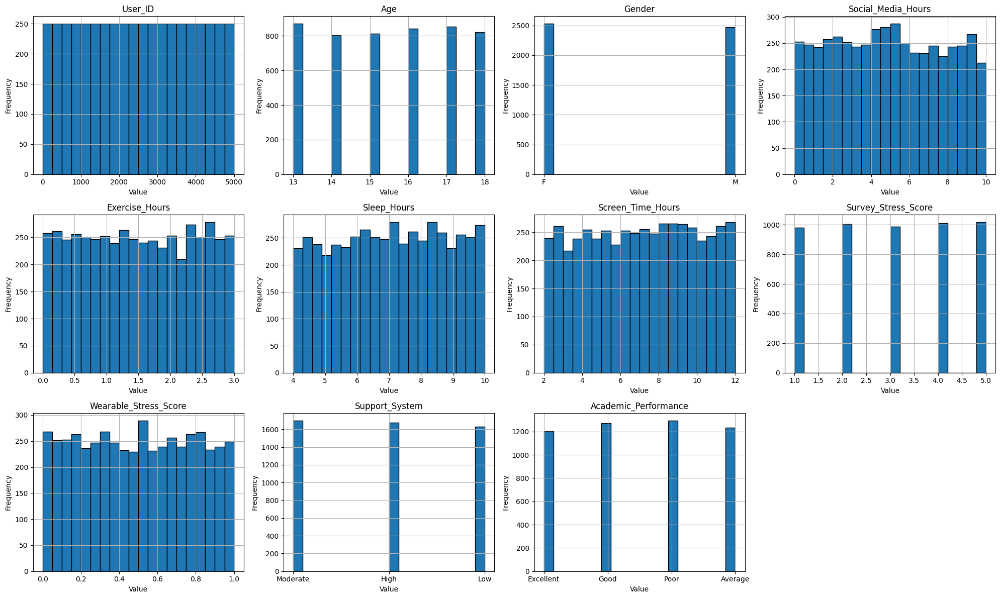

In [8]:
# Menghitung jumlah variabel
num_vars = df_health.shape[1]
 
# Menentukan jumlah baris dan kolom untuk grid subplot
n_cols = 4  # Jumlah kolom yang diinginkan
n_rows = -(-num_vars // n_cols)  # Ceiling division untuk menentukan jumlah baris
 
# Membuat subplot
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
 
# Flatten axes array untuk memudahkan iterasi jika diperlukan
axes = axes.flatten()
 
# Plot setiap variabel
for i, column in enumerate(df_health.columns):
    df_health[column].hist(ax=axes[i], bins=20, edgecolor='black')
    axes[i].set_title(column)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')
 
# Menghapus subplot yang tidak terpakai (jika ada)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
 
# Menyesuaikan layout agar lebih rapi
plt.tight_layout()
plt.show()

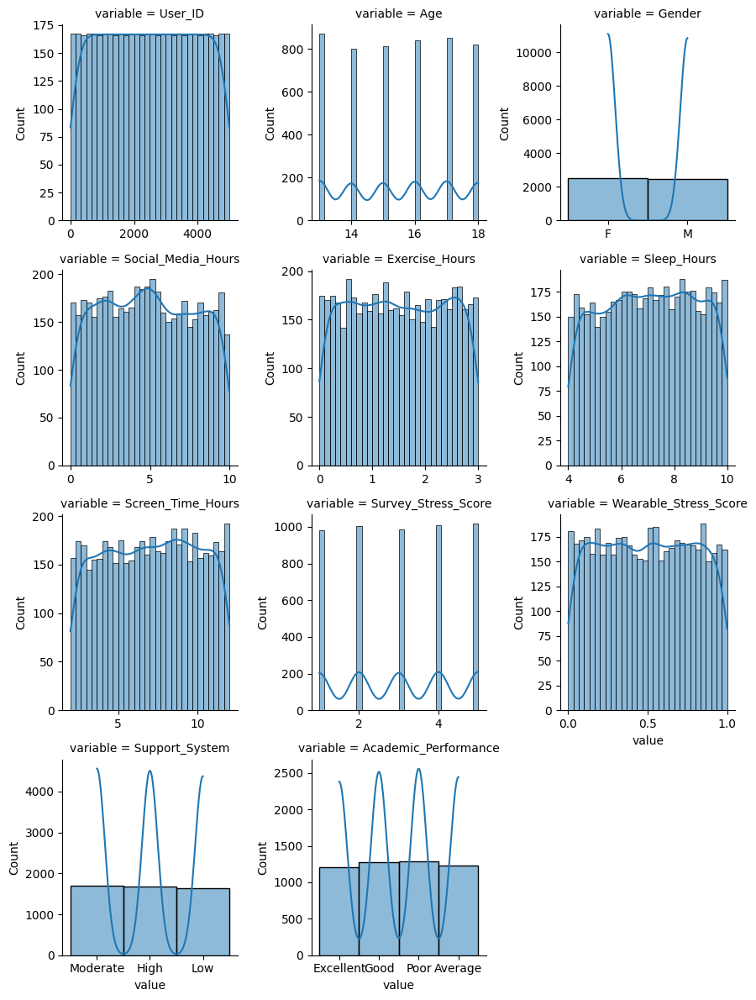

In [9]:
import seaborn as sns

g = sns.FacetGrid(df_health.melt(), col="variable", col_wrap=3, sharex=False, sharey=False)
g.map(sns.histplot, "value", kde=True, bins=30)

In [10]:
# Memasukkan ke dalam kolom object
df_health["Age"] = df_health["Age"].astype(int)
df_health["User_ID"] = df_health["User_ID"].astype(int)

# Memilih hanya kolom yang numerik saja
df_health_num = df_health.select_dtypes(include=['int64', 'float64'])

# Memilih hanya kolom yang object saja
df_health_cat = df_health.select_dtypes(include=['object'])

In [11]:
df_health_num.head()

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score
0,1,16,9.654486,2.458001,5.198926,8.158189,3,0.288962
1,2,17,9.158143,0.392095,8.866097,5.151993,5,0.409446
2,3,15,5.028755,0.520119,4.943095,9.209325,2,0.423837
3,4,17,7.951103,1.022630,5.262773,9.823658,5,0.666021
4,5,17,1.357459,1.225462,6.196080,11.338990,5,0.928060


In [12]:
df_health_cat.head()

,Gender,Support_System,Academic_Performance
0,F,Moderate,Excellent
1,M,Moderate,Good
2,M,Moderate,Poor
3,F,Moderate,Average
4,F,High,Poor


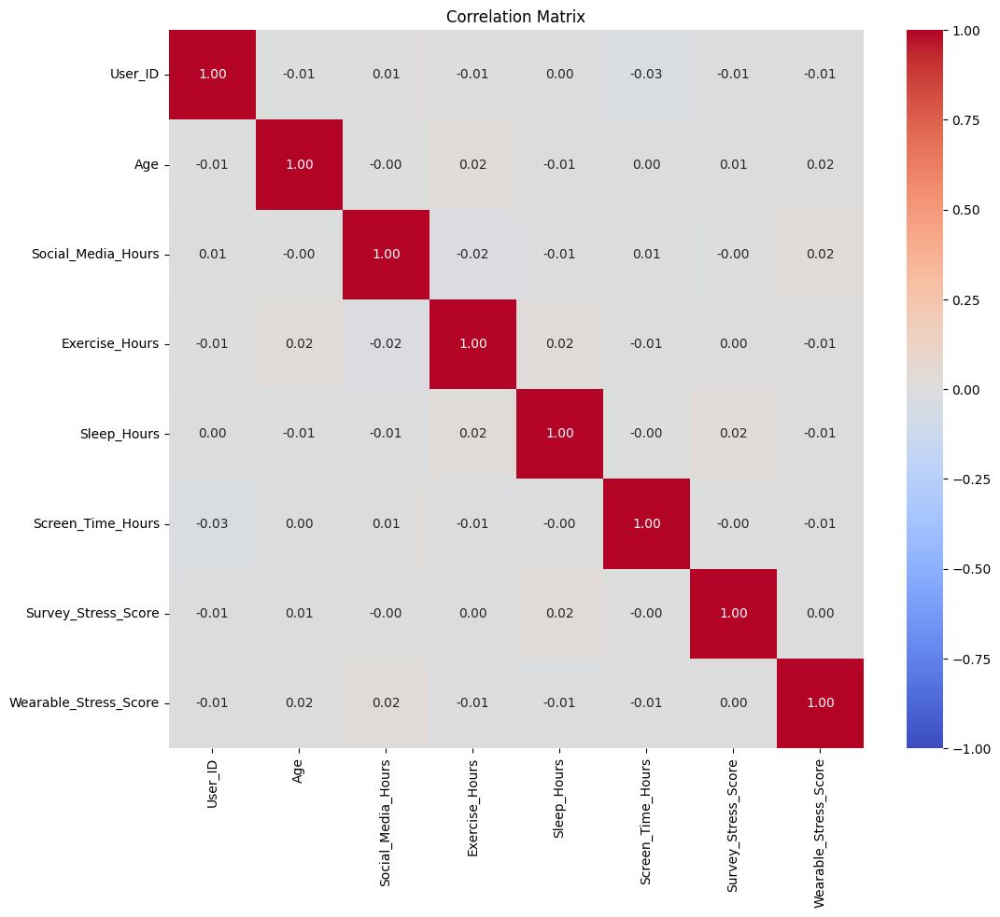

In [13]:
# Visualisasi korelasi antar variabel numerik
plt.figure(figsize=(12, 10))
correlation_matrix = df_health_num.corr()

sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

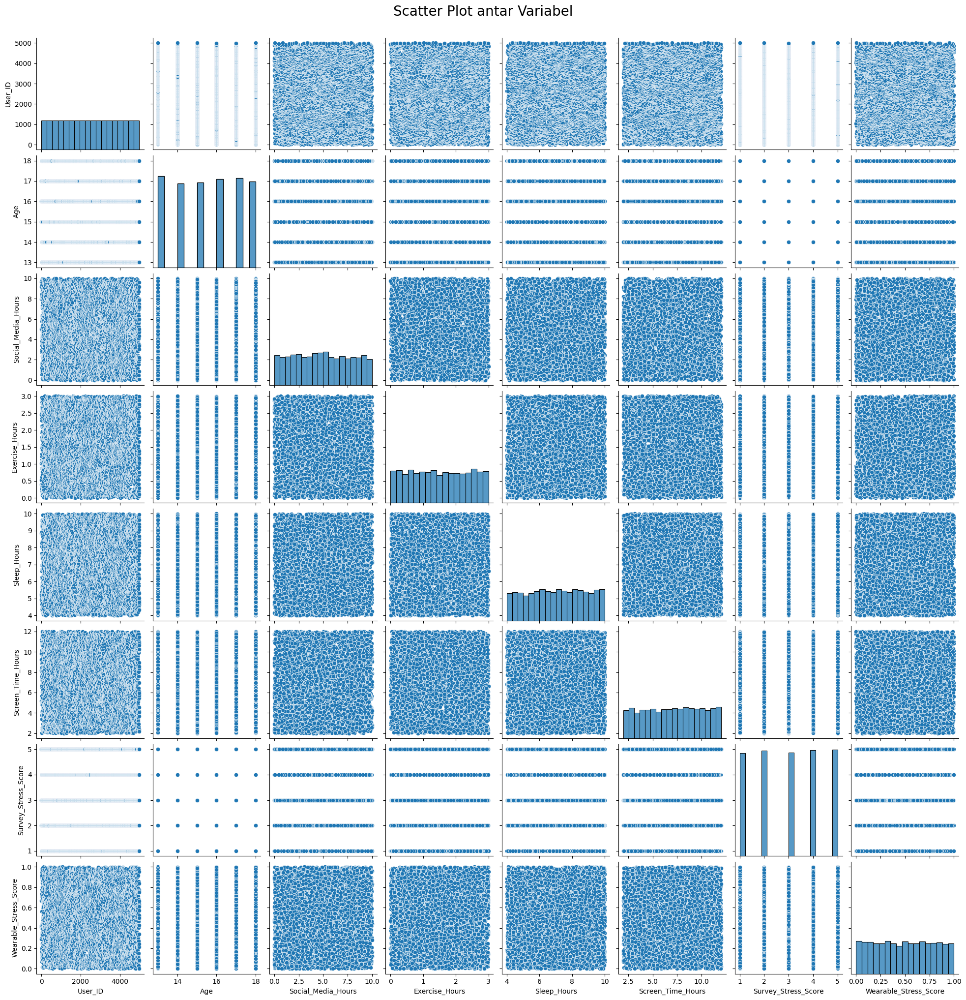

In [14]:
g = sns.pairplot(df_health_num)
g.fig.suptitle("Scatter Plot antar Variabel", fontsize=20, y=1.02)
plt.show()

In [85]:
!pip install plotly

In [28]:
import plotly.express as px

# Membuat box plot dengan Plotly
fig = px.box(df_health, 
             x="Academic_Performance", 
             y="Social_Media_Hours", 
             color="Academic_Performance",  # Menentukan warna berdasarkan kategori
             title="Box Plot Social Media Hour vs Academic Score")

fig.show()

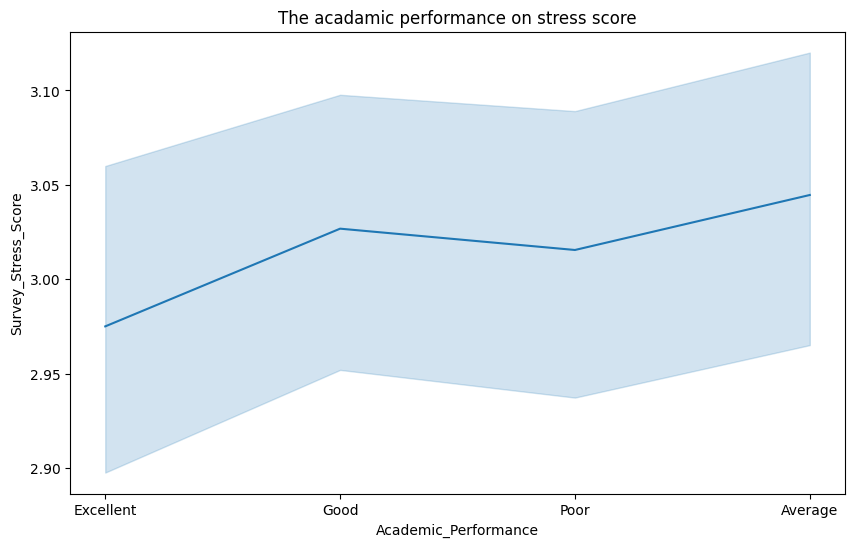

In [29]:
plt.figure(figsize=(10,6)) 
sns.lineplot(x='Academic_Performance',y='Survey_Stress_Score',data=df_health)
plt.title('The acadamic performance on stress score')
plt.show()

# **5. Data Preprocessing**

Pada tahap ini, data preprocessing adalah langkah penting untuk memastikan kualitas data sebelum digunakan dalam model machine learning. Data mentah sering kali mengandung nilai kosong, duplikasi, atau rentang nilai yang tidak konsisten, yang dapat memengaruhi kinerja model. Oleh karena itu, proses ini bertujuan untuk membersihkan dan mempersiapkan data agar analisis berjalan optimal.

Berikut adalah tahapan-tahapan yang bisa dilakukan, tetapi **tidak terbatas** pada:
1. Menghapus atau Menangani Data Kosong (Missing Values)
2. Menghapus Data Duplikat
3. Normalisasi atau Standarisasi Fitur
4. Deteksi dan Penanganan Outlier
5. Encoding Data Kategorikal
6. Binning (Pengelompokan Data)

Cukup sesuaikan dengan karakteristik data yang kamu gunakan yah.

1. Menghapus atau menangani data kosong (missing values)

In [73]:
# Memeriksa jumlah nilai yang hilang di setiap kolom
missing_values = df_health.isnull().sum()
missing_values[missing_values > 0]

Series([], dtype: int64)

In [76]:
df_health.isnull().values.any()

np.False_

In [77]:
df_health.isna().sum()

User_ID                  0
Age                      0
Gender                   0
Social_Media_Hours       0
Exercise_Hours           0
Sleep_Hours              0
Screen_Time_Hours        0
Survey_Stress_Score      0
Wearable_Stress_Score    0
Support_System           0
Academic_Performance     0
dtype: int64

2. Menghapus Data Duplikat

In [78]:
df_health.duplicated().sum()

np.int64(0)

In [80]:
print("Jumlah duplikasi : ", df_health.duplicated().sum())
df_health.describe()

Jumlah duplikasi :  0


,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,15.493200,4.932081,1.498151,7.057370,7.068630,3.015800,0.496618
std,1443.520003,1.715151,2.853928,0.873984,1.722211,2.883494,1.414762,0.289768
min,1.000000,13.000000,0.000528,0.000473,4.001515,2.000481,1.000000,0.000102
25%,1250.750000,14.000000,2.473150,0.734431,5.611836,4.574327,2.000000,0.244615
50%,2500.500000,16.000000,4.898176,1.483432,7.068874,7.118979,3.000000,0.500404
75%,3750.250000,17.000000,7.369195,2.276089,8.519411,9.526335,4.000000,0.749929
max,5000.000000,18.000000,9.995052,2.999774,9.999229,11.999010,5.000000,0.999812


3. Normalisasi atau Standarisasi Fitur

In [96]:
from sklearn.preprocessing import MinMaxScaler

# Inisialisasi MinMaxScaler
scaler = MinMaxScaler()

# Normalisasi hanya untuk fitur numerik
df_health_num_scaled = pd.DataFrame(scaler.fit_transform(df_health_num), columns=df_health_num.columns)

# Cek hasil normalisasi
df_health_num_scaled.describe()

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score
count,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,0.500000,0.49864,0.493425,0.499342,0.509503,0.506889,0.50395,0.496660
std,0.288762,0.34303,0.285549,0.291396,0.287145,0.288392,0.35369,0.289852
min,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,0.250000,0.20000,0.247398,0.244710,0.268489,0.257422,0.25000,0.244583
50%,0.500000,0.60000,0.490033,0.494435,0.511421,0.511925,0.50000,0.500447
75%,0.750000,0.80000,0.737270,0.758715,0.753270,0.752696,0.75000,0.750044
max,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000


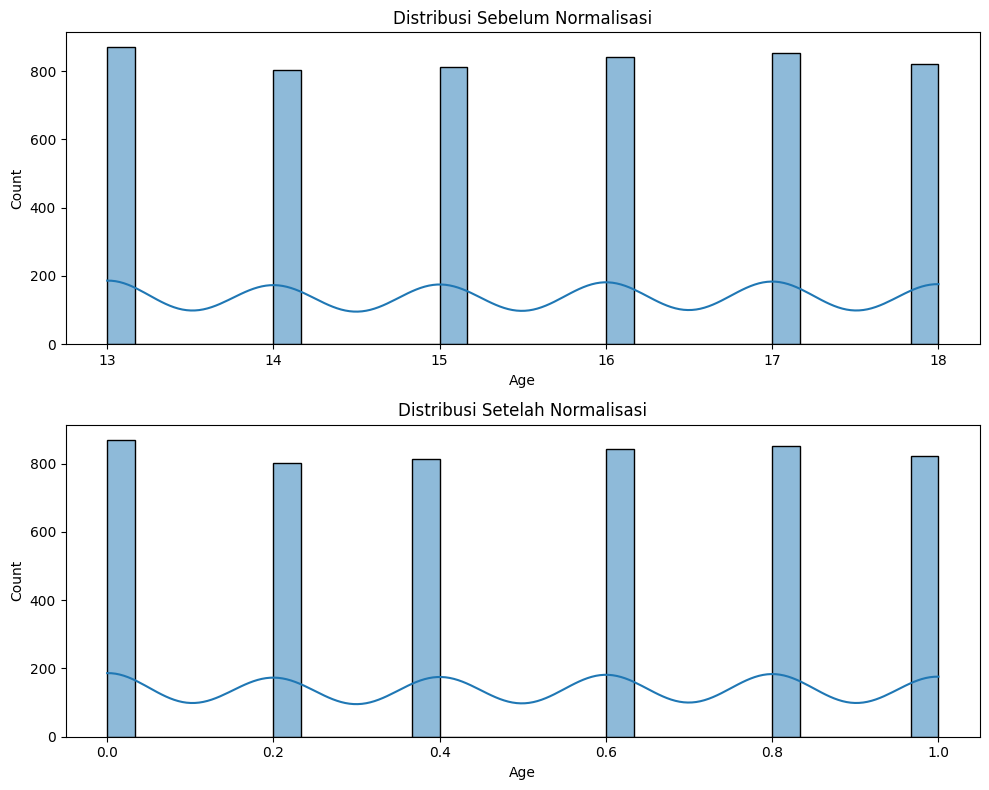

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns

# Membuat subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# Histogram sebelum normalisasi
sns.histplot(df_health_num["Age"], bins=30, kde=True, ax=axes[0])
axes[0].set_title("Distribusi Sebelum Normalisasi")

# Histogram setelah normalisasi
sns.histplot(df_health_num_scaled["Age"], bins=30, kde=True, ax=axes[1])
axes[1].set_title("Distribusi Setelah Normalisasi")

plt.tight_layout()
plt.show()

In [99]:
# Memisahkan fitur (X) dan target (y)
X = df_health.drop(columns=['Academic_Performance'])  
y = df_health['Academic_Performance'] 

In [100]:
from sklearn.model_selection import train_test_split
 
# membagi dataset menjadi training dan testing 
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [101]:
# menghitung panjang/jumlah data 
print("Jumlah data: ",len(X))
# menghitung panjang/jumlah data pada x_test
print("Jumlah data latih: ",len(x_train))
# menghitung panjang/jumlah data pada x_test
print("Jumlah data test: ",len(x_test))

Jumlah data:  5000
Jumlah data latih:  4000
Jumlah data test:  1000


4. Deteksi dan Penanganan Outlier

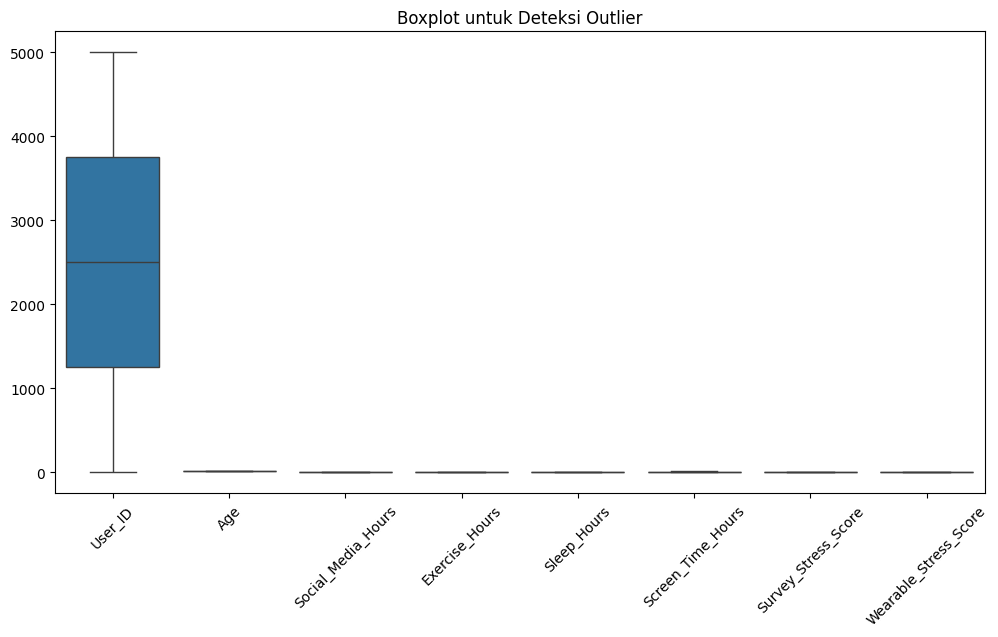

In [128]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_health_num)
plt.xticks(rotation=45)
plt.title("Boxplot untuk Deteksi Outlier")
plt.show()

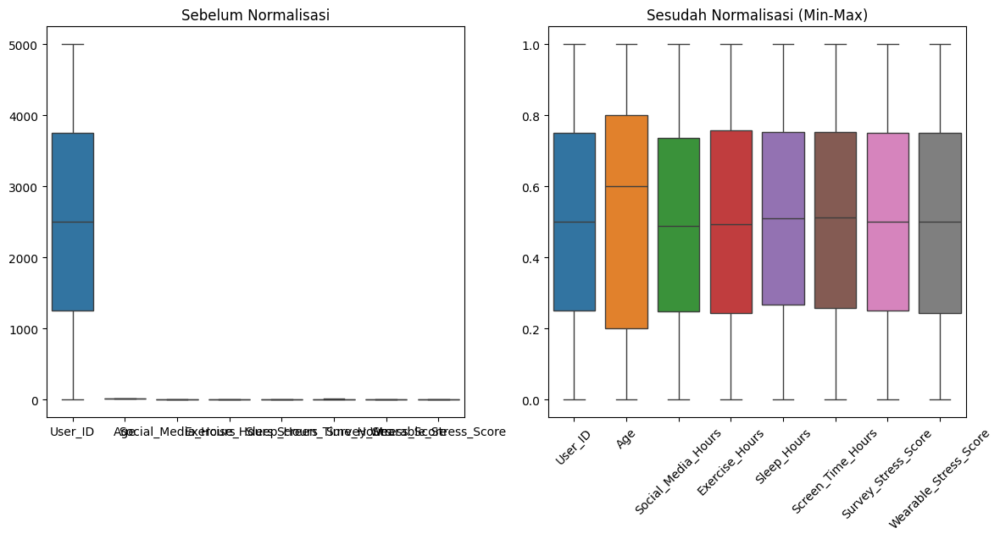

In [129]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Sebelum Normalisasi
sns.boxplot(data=df_health_num, ax=axes[0])
axes[0].set_title("Sebelum Normalisasi")

# Sesudah Normalisasi
sns.boxplot(data=df_scaled, ax=axes[1])
axes[1].set_title("Sesudah Normalisasi (Min-Max)")

plt.xticks(rotation=45)
plt.show()

In [121]:
Q1 = df_health_num.quantile(0.25)
Q3 = df_health_num.quantile(0.75)
IQR = Q3 - Q1

outlier_mask = (df_health_num < (Q1 - 1.5 * IQR)) | (df_health_num > (Q3 + 1.5 * IQR))
df_outliers = df_health_num[outlier_mask.any(axis=1)]
print("Jumlah outlier:", df_outliers.shape[0])
print(f"Jumlah outlier per kolom:\n{outliers}")

Jumlah outlier: 0
Jumlah outlier per kolom:
User_ID                  0
Age                      0
Social_Media_Hours       0
Exercise_Hours           0
Sleep_Hours              0
Screen_Time_Hours        0
Survey_Stress_Score      0
Wearable_Stress_Score    0
dtype: int64


In [110]:
df_cleaned = df_health_num[~((df_health_num < lower_bound) | (df_health_num > upper_bound)).any(axis=1)]
print(f"Jumlah data setelah menghapus outlier: {len(df_cleaned)}")

Jumlah data setelah menghapus outlier: 5000


In [112]:
df_replaced = df_health_num.copy()
for col in df_health_num.columns:
    median = df_health_num[col].median()
    df_replaced[col] = np.where(
        (df_health_num[col] < lower_bound[col]) | (df_health_num[col] > upper_bound[col]),
        median,
        df_health_num[col]
    )

In [113]:
df_transformed = df_health_num.apply(lambda x: np.log1p(x))

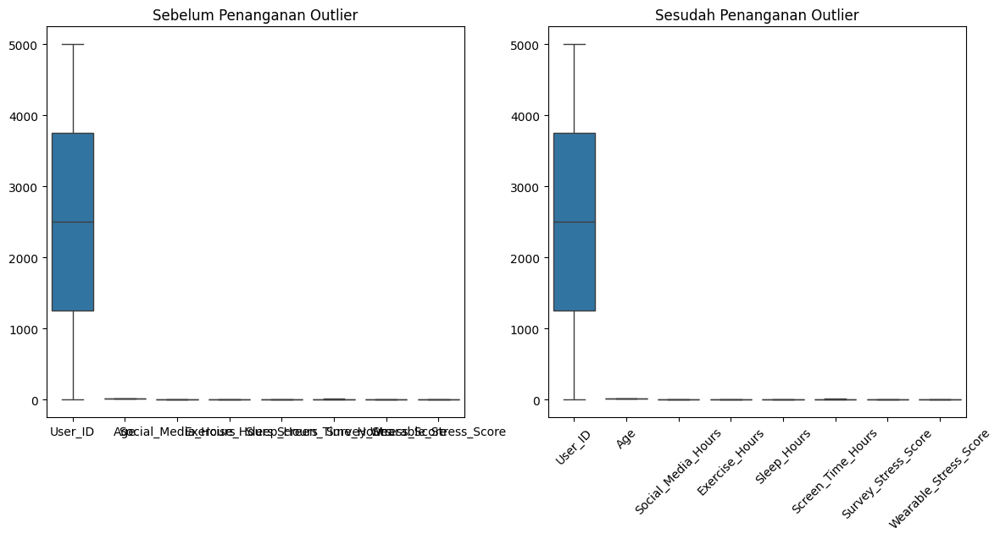

In [125]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Sebelum penanganan
sns.boxplot(data=df_health_num, ax=axes[0])
axes[0].set_title("Sebelum Penanganan Outlier")

# Sesudah penanganan
sns.boxplot(data=df_cleaned, ax=axes[1])
axes[1].set_title("Sesudah Penanganan Outlier")

plt.xticks(rotation=45)
plt.show()

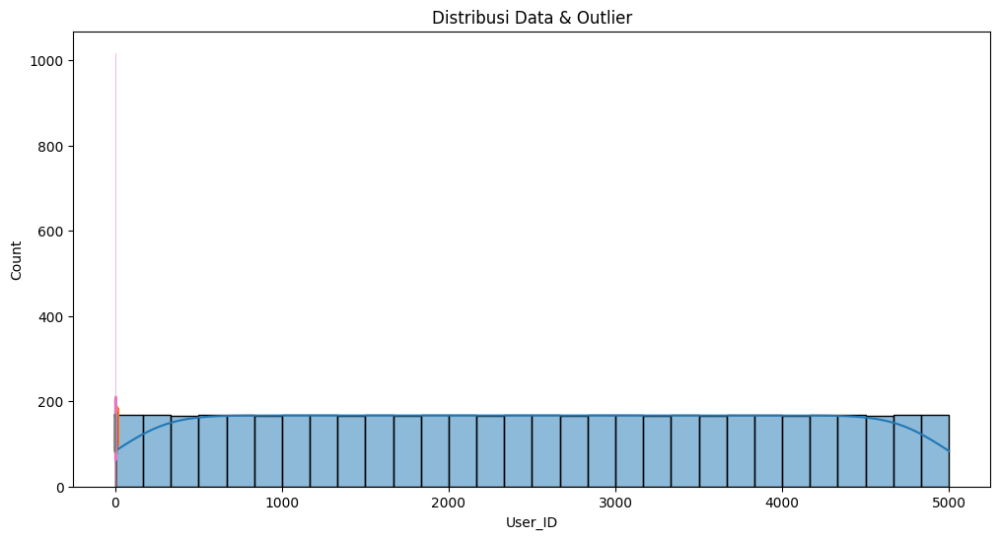

In [116]:
plt.figure(figsize=(12, 6))
for col in df_health_num.columns:
    sns.histplot(df_health_num[col], kde=True, bins=30, alpha=0.5)
plt.title("Distribusi Data & Outlier")
plt.show()

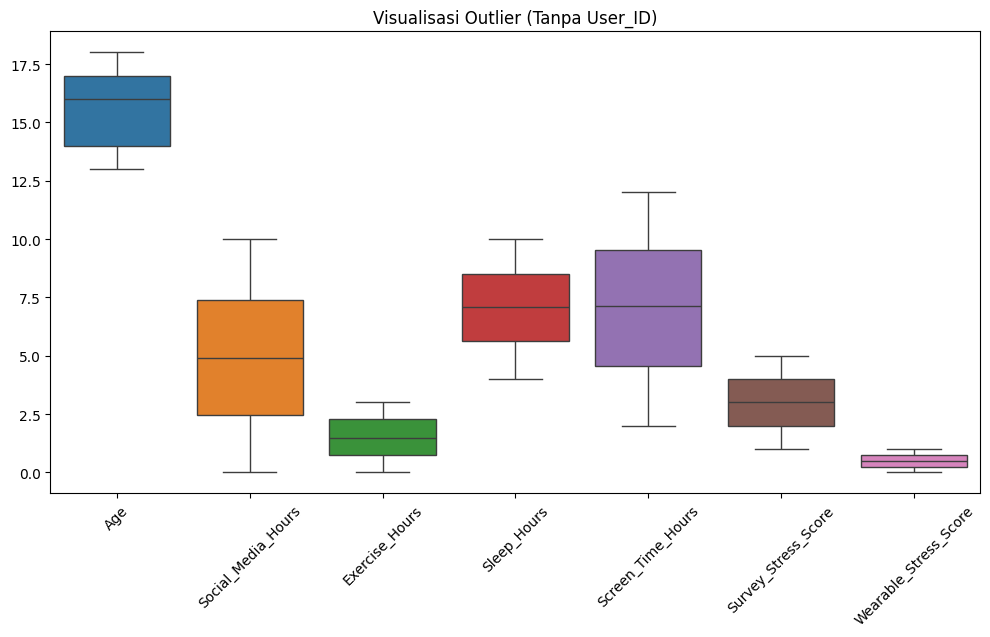

In [130]:
# Menghapus User_ID dari visualisasi
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_health_num.drop(columns=['User_ID'])) 
plt.xticks(rotation=45)
plt.title("Visualisasi Outlier (Tanpa User_ID)")
plt.show()

5. Encoding Data Kategorikal

In [138]:
df_health_encoded = pd.get_dummies(df_health, drop_first=True)

In [365]:
from sklearn.preprocessing import LabelEncoder

# Buat encoder
le = LabelEncoder()

# Lakukan encoding pada kolom kategorikal
df_health['Gender'] = le.fit_transform(df_health['Gender'])

#encoding Support_System
df_health['Support_System'] = le.fit_transform(df_health['Support_System'])

# Encoding Academic_Performance
df_health['Academic_Performance'] = le.fit_transform(df_health['Academic_Performance'])

# Cek hasil
print(df_health[['Gender', 'Support_System', 'Academic_Performance']].head())

   Gender  Support_System  Academic_Performance
0       0               2                     1
1       1               2                     2
2       1               2                     3
3       0               2                     0
4       0               0                     3


In [182]:
print(df_health.columns)  # Lihat daftar kolom

Index(['User_ID', 'Age', 'Gender', 'Social_Media_Hours', 'Exercise_Hours',
       'Sleep_Hours', 'Screen_Time_Hours', 'Survey_Stress_Score',
       'Wearable_Stress_Score', 'Support_System', 'Academic_Performance',
       'Age_Group'],
      dtype='object')


In [183]:
df_health.head()

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance,Age_Group
0,1,16,0,9.654486,2.458001,5.198926,8.158189,3,0.288962,2,3,0
1,2,17,1,9.158143,0.392095,8.866097,5.151993,5,0.409446,2,2,0
2,3,15,1,5.028755,0.520119,4.943095,9.209325,2,0.423837,2,0,0
3,4,17,0,7.951103,1.022630,5.262773,9.823658,5,0.666021,2,1,0
4,5,17,0,1.357459,1.225462,6.196080,11.338990,5,0.928060,0,0,0


In [184]:
print(df_health.head())
print(df_health.dtypes)  # Pastikan kolom kategorikal sudah berubah menjadi numerik

   User_ID  Age  Gender  Social_Media_Hours  Exercise_Hours  Sleep_Hours  \
0        1   16       0            9.654486        2.458001     5.198926   
1        2   17       1            9.158143        0.392095     8.866097   
2        3   15       1            5.028755        0.520119     4.943095   
3        4   17       0            7.951103        1.022630     5.262773   
4        5   17       0            1.357459        1.225462     6.196080   

   Screen_Time_Hours  Survey_Stress_Score  Wearable_Stress_Score  \
0           8.158189                    3               0.288962   
1           5.151993                    5               0.409446   
2           9.209325                    2               0.423837   
3           9.823658                    5               0.666021   
4          11.338990                    5               0.928060   

   Support_System  Academic_Performance  Age_Group  
0               2                     3          0  
1               2           

6. Binning (Pengelompokan Data)

In [185]:
# Definisi bins dan label
bins = [0, 12, 19, 35, 55, 100]
labels = ['Children', 'Teenagers', 'Young Adults', 'Middle Age', 'Seniors']

# Buat kolom baru dengan kategori usia
df_health['Age_Group'] = pd.cut(df_health['Age'], bins=bins, labels=labels)

# Cek apakah kolom berhasil ditambahkan
print(df_health[['Age', 'Age_Group']].head())

   Age  Age_Group
0   16  Teenagers
1   17  Teenagers
2   15  Teenagers
3   17  Teenagers
4   17  Teenagers


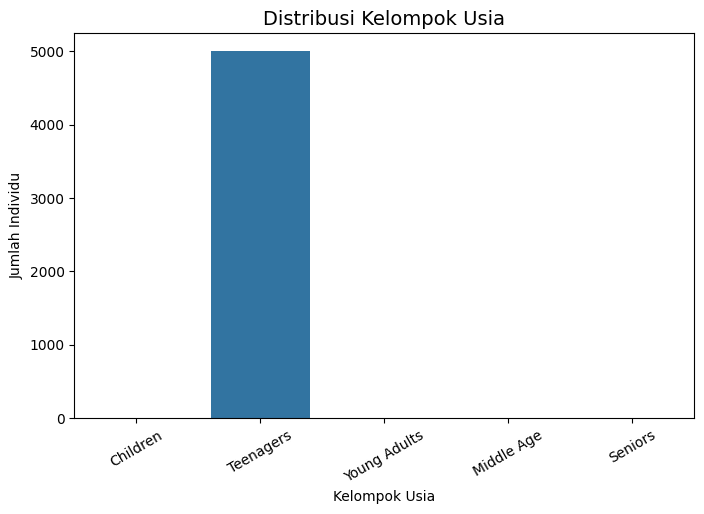

In [186]:
# Plot distribusi kelompok usia
plt.figure(figsize=(8, 5))
sns.countplot(x=df_health['Age_Group'])

# Tambahkan judul
plt.title("Distribusi Kelompok Usia", fontsize=14)
plt.xlabel("Kelompok Usia")
plt.ylabel("Jumlah Individu")

# Rotasi label jika diperlukan
plt.xticks(rotation=30)
plt.show()

In [187]:
import pandas as pd

# Definisi bins dan labels
bins = [0, 2, 4, 5]  # Batas kategori
labels = ['Low', 'Moderate', 'High']  # Label kategori

# Lakukan binning pada Survey_Stress_Score
df_health['Survey_Stress_Level'] = pd.cut(df_health['Survey_Stress_Score'], bins=bins, labels=labels)

# Cek hasil binning
print(df_health[['Survey_Stress_Score', 'Survey_Stress_Level']].head())

   Survey_Stress_Score Survey_Stress_Level
0                    3            Moderate
1                    5                High
2                    2                 Low
3                    5                High
4                    5                High


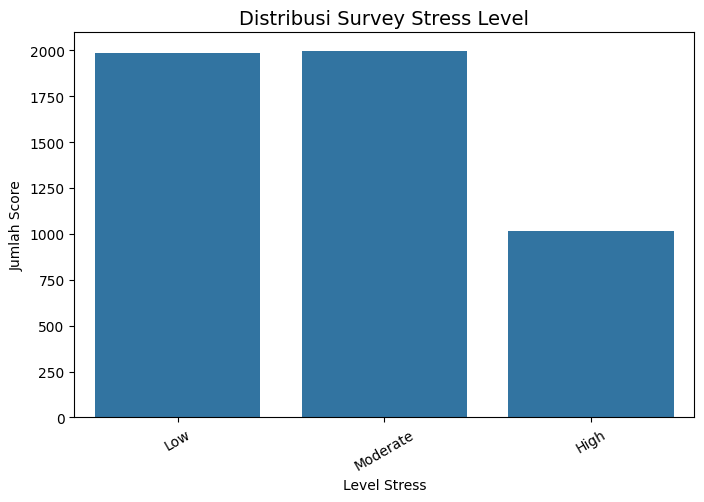

In [189]:
# Plot distribusi Survey Stress Level
plt.figure(figsize=(8, 5))
sns.countplot(x=df_health['Survey_Stress_Level'])

# Tambahkan judul
plt.title("Distribusi Survey Stress Level", fontsize=14)
plt.xlabel("Level Stress")
plt.ylabel("Jumlah Score")

# Rotasi label jika diperlukan
plt.xticks(rotation=30)
plt.show()

In [188]:
# Definisi bins dan labels untuk Wearable_Stress_Score
bins = [0, 0.3, 0.7, 1.0]
labels = ['Low', 'Moderate', 'High']

# Binning Wearable_Stress_Score
df_health['Wearable_Stress_Level'] = pd.cut(df_health['Wearable_Stress_Score'], bins=bins, labels=labels)

# Encoding jika diperlukan
df_health['Wearable_Stress_Level'] = le.fit_transform(df_health['Wearable_Stress_Level'])

# Cek hasilnya
print(df_health[['Wearable_Stress_Score', 'Wearable_Stress_Level']].head())

   Wearable_Stress_Score  Wearable_Stress_Level
0               0.288962                      1
1               0.409446                      2
2               0.423837                      2
3               0.666021                      2
4               0.928060                      0


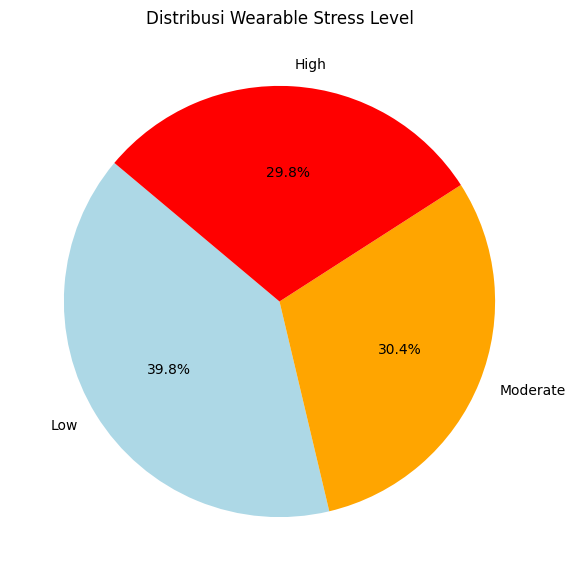

In [190]:
import matplotlib.pyplot as plt

# Hitung jumlah setiap kategori
wearable_counts = df_health['Wearable_Stress_Level'].value_counts()

# Buat label kategori yang sesuai dengan angka dari LabelEncoder
labels = ['Low', 'Moderate', 'High']

# Buat pie chart
plt.figure(figsize=(7, 7))
plt.pie(wearable_counts, labels=labels, autopct='%1.1f%%', colors=['lightblue', 'orange', 'red'], startangle=140)

# Tambahkan judul
plt.title("Distribusi Wearable Stress Level")

# Tampilkan plot
plt.show()

# **6. Pembangunan Model Clustering**

## **a. Pembangunan Model Clustering**

Pada tahap ini, Anda membangun model clustering dengan memilih algoritma yang sesuai untuk mengelompokkan data berdasarkan kesamaan. Berikut adalah **rekomendasi** tahapannya.
1. Pilih algoritma clustering yang sesuai.
2. Latih model dengan data menggunakan algoritma tersebut.

In [285]:
df_health_num.head()

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,label
0,1,16,9.654486,2.458001,5.198926,8.158189,3,0.288962,4
1,2,17,9.158143,0.392095,8.866097,5.151993,5,0.409446,2
2,3,15,5.028755,0.520119,4.943095,9.209325,2,0.423837,2
3,4,17,7.951103,1.022630,5.262773,9.823658,5,0.666021,4
4,5,17,1.357459,1.225462,6.196080,11.338990,5,0.928060,3


In [286]:
df_health_cat.head()

,Gender,Support_System,Academic_Performance,label
0,F,Moderate,Excellent,4
1,M,Moderate,Good,2
2,M,Moderate,Poor,2
3,F,Moderate,Average,4
4,F,High,Poor,3


In [287]:
# Turn gender into binary. No pun intended, it has two unique data value
df_health_cat_new = pd.get_dummies(df_health, columns=['Gender'], drop_first=True)  
df_health_cat_new.head(5)

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance,Gender_M
0,1,16,9.654486,2.458001,5.198926,8.158189,3,0.288962,Moderate,Excellent,False
1,2,17,9.158143,0.392095,8.866097,5.151993,5,0.409446,Moderate,Good,True
2,3,15,5.028755,0.520119,4.943095,9.209325,2,0.423837,Moderate,Poor,True
3,4,17,7.951103,1.022630,5.262773,9.823658,5,0.666021,Moderate,Average,False
4,5,17,1.357459,1.225462,6.196080,11.338990,5,0.928060,High,Poor,False


In [308]:
df_health_cat_new[['Gender_M']].head(5)

,Gender_M
0,False
1,True
2,True
3,False
4,False


In [309]:
df_health_cat_new.head()

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance,Gender_M
0,1,16,9.654486,2.458001,5.198926,8.158189,3,0.288962,2,1,False
1,2,17,9.158143,0.392095,8.866097,5.151993,5,0.409446,2,2,True
2,3,15,5.028755,0.520119,4.943095,9.209325,2,0.423837,2,3,True
3,4,17,7.951103,1.022630,5.262773,9.823658,5,0.666021,2,0,False
4,5,17,1.357459,1.225462,6.196080,11.338990,5,0.928060,0,3,False


In [310]:
from sklearn.preprocessing import LabelEncoder

# Buat objek LabelEncoder
label_encoder = LabelEncoder()

# List kolom yang akan diubah
columns_to_encode = ['Support_System', 'Academic_Performance']

# Loop untuk mengonversi setiap kolom
for col in columns_to_encode:
 df_health_cat_new[col] = label_encoder.fit_transform(df_health_cat_new[col])

# Cek hasilnya
df_health_cat_new.head()

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance,Gender_M
0,1,16,9.654486,2.458001,5.198926,8.158189,3,0.288962,2,1,False
1,2,17,9.158143,0.392095,8.866097,5.151993,5,0.409446,2,2,True
2,3,15,5.028755,0.520119,4.943095,9.209325,2,0.423837,2,3,True
3,4,17,7.951103,1.022630,5.262773,9.823658,5,0.666021,2,0,False
4,5,17,1.357459,1.225462,6.196080,11.338990,5,0.928060,0,3,False


In [311]:
df_health_cat_new[['Support_System', 'Academic_Performance']].head(5)

,Support_System,Academic_Performance
0,2,1
1,2,2
2,2,3
3,2,0
4,0,3


In [312]:
df_health_cat_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   User_ID                5000 non-null   int64  
 1   Age                    5000 non-null   int64  
 2   Social_Media_Hours     5000 non-null   float64
 3   Exercise_Hours         5000 non-null   float64
 4   Sleep_Hours            5000 non-null   float64
 5   Screen_Time_Hours      5000 non-null   float64
 6   Survey_Stress_Score    5000 non-null   int64  
 7   Wearable_Stress_Score  5000 non-null   float64
 8   Support_System         5000 non-null   int64  
 9   Academic_Performance   5000 non-null   int64  
 10  Gender_M               5000 non-null   bool   
dtypes: bool(1), float64(5), int64(5)
memory usage: 395.6 KB


In [293]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [294]:
data_num = MinMaxScaler().fit_transform(df_health_cat_new)
df_health_num_scaled = pd.DataFrame(data_num, columns = df_health_cat_new.columns)
df_health_num_scaled.head(5)

scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_health_cat_new), columns = df_health_cat_new.columns)
df_scaled.head(5)

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance,Gender_M
0,0.0000,0.6,0.965925,0.819367,0.199645,0.615861,0.50,0.288944,1.0,0.333333,0.0
1,0.0002,0.8,0.916263,0.130571,0.811073,0.315198,1.00,0.409463,1.0,0.666667,1.0
2,0.0004,0.4,0.503098,0.173256,0.156990,0.720991,0.25,0.423858,1.0,1.000000,1.0
3,0.0006,0.8,0.795493,0.340798,0.210290,0.782433,1.00,0.666112,1.0,0.000000,0.0
4,0.0008,0.8,0.135767,0.408425,0.365900,0.933988,1.00,0.928227,0.0,1.000000,0.0


In [62]:
df_health_pca = PCA(n_components = 2).fit_transform(df_scaled)
df_health_pca

array([[-0.44513571,  0.52889096],
       [ 0.55332032,  0.40149933],
       [ 0.55318659,  0.45318938],
       ...,
       [ 0.45571442, -0.55109159],
       [-0.53082377, -0.45051805],
       [ 0.5505575 ,  0.40504302]], shape=(5000, 2))

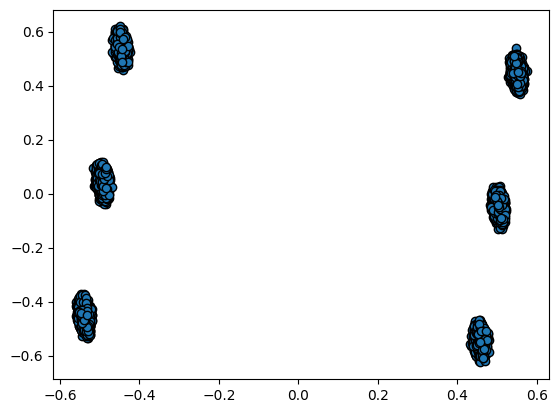

In [81]:
plt.scatter(df_health_pca[:,0], df_health_pca[:,1], edgecolor = 'black')
plt.show()

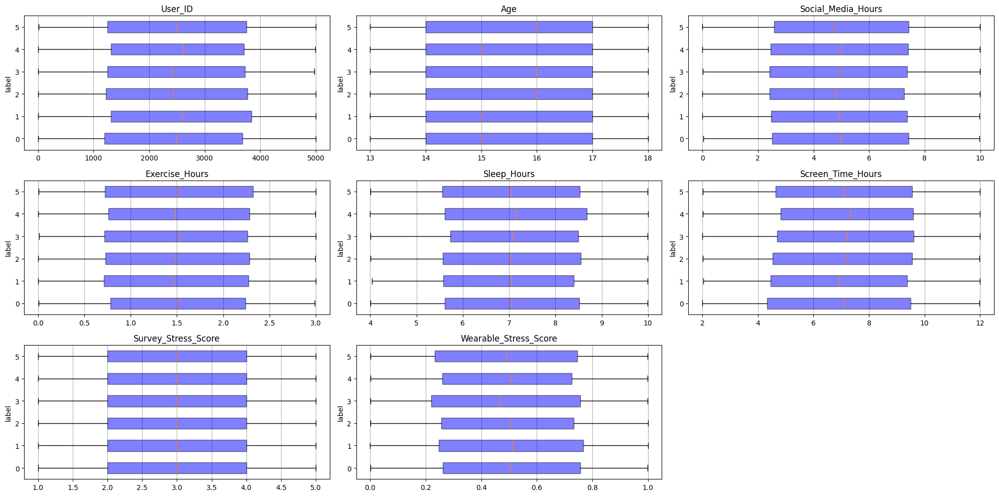

In [201]:
count = 0
plt.figure(figsize = (20, 10))
for i in df_health_num.drop('label', axis = 1).columns:
    count += 1
    plt.subplot(3, 3, count)
    plt.title(i)
    dict_data = {}
    for j in df_health_num['label'].unique():
        dict_data[j] = list(df_health_num[df_health_num['label'] == j][i].copy())
    plt.boxplot(dict_data.values(), vert  = False, zorder = 2, patch_artist = True, boxprops=dict(facecolor = 'blue', alpha =0.5))
    plt.grid(axis = 'x',zorder = 1)
    plt.yticks(ticks = [1, 2, 3, 4, 5, 6], labels = [0, 1, 2, 3,4, 5])
    plt.ylabel('label')
plt.tight_layout()
plt.show()

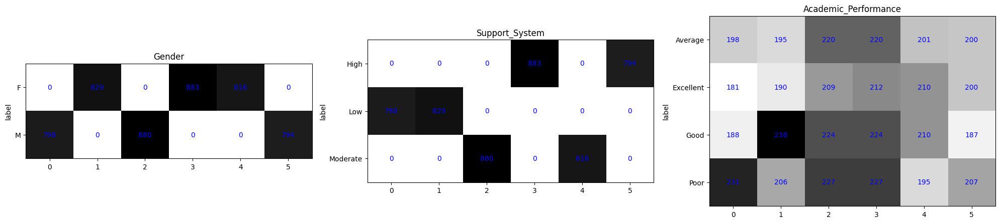

In [202]:
count = 0
plt.figure(figsize = (20, 10))
for i in df_health_cat.drop('label', axis = 1).columns:
    count += 1
    plt.subplot(2, 3, count)
    plt.title(i)
    crossing = pd.crosstab(df_health_cat[i], df_health_cat['label']).copy()
    plt.imshow(np.array(crossing), cmap = 'Greys')
    plt.yticks(ticks = [i for i in range(0, df_health_cat[i].nunique())], labels = crossing.index)
    plt.xticks(ticks = [i for i in range(0, df_health_cat['label'].nunique())], labels = crossing.columns, rotation = 0)
    for m in range(0, len(crossing.columns)):
        for n in range(0, len(crossing.index)):
            plt.text(x = m, y = n,s = crossing[crossing.columns[m]].loc[crossing.index[n]], color = 'blue', ha = 'center', va  = 'center')

    plt.ylabel('label')
plt.tight_layout()
plt.show()

## **b. Evaluasi Model Clustering**

Untuk menentukan jumlah cluster yang optimal dalam model clustering, Anda dapat menggunakan metode Elbow atau Silhouette Score.

Metode ini membantu kita menemukan jumlah cluster yang memberikan pemisahan terbaik antar kelompok data, sehingga model yang dibangun dapat lebih efektif. Berikut adalah **rekomendasi** tahapannya.
1. Gunakan Silhouette Score dan Elbow Method untuk menentukan jumlah cluster optimal.
2. Hitung Silhouette Score sebagai ukuran kualitas cluster.

In [245]:
from sklearn.metrics import silhouette_score

# Menentukan Jumlah Cluster Menggunakan Elbow Method dan Silhouette Score
wcss = []
silhouette_scores = []

K = range(2, 11)  # Uji untuk 2-10 cluster
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_health_pca)
    wcss.append(kmeans.inertia_)

    # Hitung Silhouette Score
    silhouette_avg = silhouette_score(df_health_pca, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

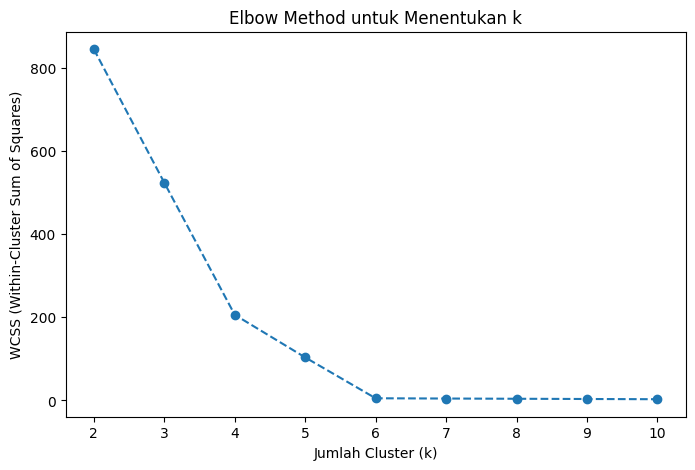

In [246]:
plt.figure(figsize=(8, 5))
plt.plot(K, wcss, marker='o', linestyle='--')
plt.xlabel("Jumlah Cluster (k)")
plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
plt.title("Elbow Method untuk Menentukan k")
plt.show()

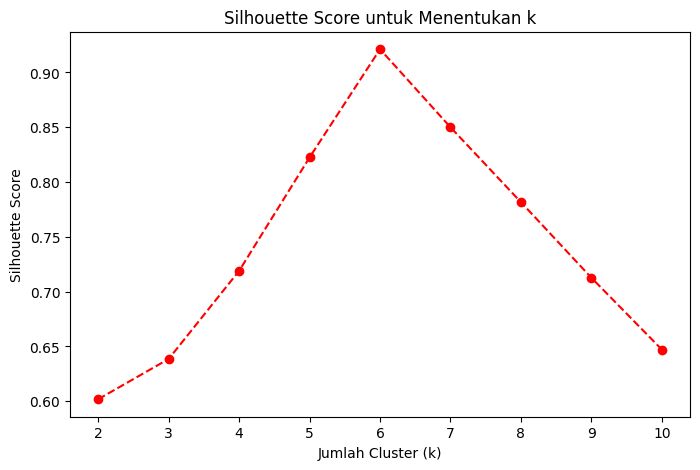

In [247]:
plt.figure(figsize=(8, 5))
plt.plot(K, silhouette_scores, marker='o', linestyle='--', color='red')
plt.xlabel("Jumlah Cluster (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score untuk Menentukan k")
plt.show()

In [248]:
optimal_k = K[np.argmax(silhouette_scores)]
print(f"Jumlah cluster optimal berdasarkan Silhouette Score: {optimal_k}")

Jumlah cluster optimal berdasarkan Silhouette Score: 6


In [249]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
clusters = kmeans.fit_predict(df_health_pca)

In [250]:
df['Cluster'] = clusters

In [251]:
silhouette_avg = silhouette_score(df_health_pca, clusters)
print(f"Silhouette Score: {silhouette_avg:.4f}")

Silhouette Score: 0.9212


## **c. Feature Selection (Opsional)**

Silakan lakukan feature selection jika Anda membutuhkan optimasi model clustering. Jika Anda menerapkan proses ini, silakan lakukan pemodelan dan evaluasi kembali menggunakan kolom-kolom hasil feature selection. Terakhir, bandingkan hasil performa model sebelum dan sesudah menerapkan feature selection.

In [ ]:
#Type your code here

## **d. Visualisasi Hasil Clustering**

Setelah model clustering dilatih dan jumlah cluster optimal ditentukan, langkah selanjutnya adalah menampilkan hasil clustering melalui visualisasi.

Berikut adalah **rekomendasi** tahapannya.
1. Tampilkan hasil clustering dalam bentuk visualisasi, seperti grafik scatter plot atau 2D PCA projection.

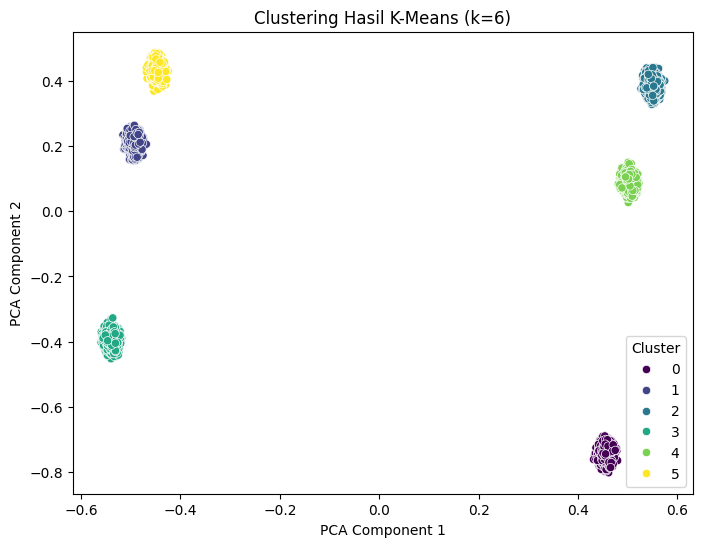

In [252]:
# Visualisasi Hasil Clustering
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_health_pca[:, 0], y=df_pca[:, 1], hue=clusters, palette="viridis")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title(f"Clustering Hasil K-Means (k={optimal_k})")
plt.legend(title="Cluster")
plt.show()

## **e. Analisis dan Interpretasi Hasil Cluster**

### Interpretasi Target

**Tutorial: Melakukan Inverse Transform pada Data Target Setelah Clustering**

Setelah melakukan clustering dengan model **KMeans**, kita perlu mengembalikan data yang telah diubah (normalisasi, standarisasi, atau label encoding) ke bentuk aslinya. Berikut adalah langkah-langkahnya.

---

**1. Tambahkan Hasil Label Cluster ke DataFrame**
Setelah mendapatkan hasil clustering, kita tambahkan label cluster ke dalam DataFrame yang telah dinormalisasi.

```python
df_normalized['Cluster'] = model_kmeans.labels_
```

Lakukan Inverse Transform pada feature yang sudah dilakukan Labelisasi dan Standararisasi. Berikut code untuk melakukannya:
label_encoder.inverse_transform(X_Selected[['Fitur']])

Lalu masukkan ke dalam kolom dataset asli atau membuat dataframe baru
```python
df_normalized['Fitur'] = label_encoder.inverse_transform(df_normalized[['Fitur']])
```
Masukkan Data yang Sudah Di-Inverse ke dalam Dataset Asli atau Buat DataFrame Baru
```python
df_original['Fitur'] = df_normalized['Fitur']
```

In [371]:
df['Cluster'] = clusters

In [397]:
import pandas as pd

df_health = pd.read_csv("data/mental_health_analysis.csv")

# Buat encoder untuk setiap kolom
le_gender = LabelEncoder()
le_support_system = LabelEncoder()
le_academic_performance = LabelEncoder()

# Lakukan encoding pada kolom kategorikal
df_health['Gender'] = le_gender.fit_transform(df_health['Gender'])
df_health['Support_System'] = le_support_system.fit_transform(df_health['Support_System'])
df_health['Academic_Performance'] = le_academic_performance.fit_transform(df_health['Academic_Performance'])

# Cek hasil encoding
print("Hasil Encoding:")
print(df_health[['Gender', 'Support_System', 'Academic_Performance']])

# Mengembalikan ke bentuk asli
df_health_cat_new = df_health.copy()
df_health_cat_new['Gender'] = le_gender.inverse_transform(df_health['Gender'])
df_health_cat_new['Support_System'] = le_support_system.inverse_transform(df_health['Support_System'])
df_health_cat_new['Academic_Performance'] = le_academic_performance.inverse_transform(df_health['Academic_Performance'])

# Cek hasil setelah dikembalikan
print("\nHasil Setelah Dikembalikan:")
print(df_health_cat_new[['Gender', 'Support_System', 'Academic_Performance']])

Hasil Encoding:
      Gender  Support_System  Academic_Performance
0          0               2                     1
1          1               2                     2
2          1               2                     3
3          0               2                     0
4          0               0                     3
...      ...             ...                   ...
4995       1               2                     0
4996       0               2                     1
4997       1               0                     2
4998       0               0                     0
4999       1               2                     1

[5000 rows x 3 columns]

Hasil Setelah Dikembalikan:
     Gender Support_System Academic_Performance
0         F       Moderate            Excellent
1         M       Moderate                 Good
2         M       Moderate                 Poor
3         F       Moderate              Average
4         F           High                 Poor
...     ...            ...    

In [398]:
print(df_health_original_new.dtypes)

User_ID                    int64
Age                        int64
Gender                    object
Social_Media_Hours       float64
Exercise_Hours           float64
Sleep_Hours              float64
Screen_Time_Hours        float64
Survey_Stress_Score        int64
Wearable_Stress_Score    float64
Support_System            object
Academic_Performance      object
dtype: object


In [389]:
df_health_original_new.head()

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance
0,1,16,F,9.654486,2.458001,5.198926,8.158189,3,0.288962,Moderate,Excellent
1,2,17,M,9.158143,0.392095,8.866097,5.151993,5,0.409446,Moderate,Good
2,3,15,M,5.028755,0.520119,4.943095,9.209325,2,0.423837,Moderate,Poor
3,4,17,F,7.951103,1.022630,5.262773,9.823658,5,0.666021,Moderate,Average
4,5,17,F,1.357459,1.225462,6.196080,11.338990,5,0.928060,High,Poor


In [390]:
print(df_health_original_new.columns)

Index(['User_ID', 'Age', 'Gender', 'Social_Media_Hours', 'Exercise_Hours',
       'Sleep_Hours', 'Screen_Time_Hours', 'Survey_Stress_Score',
       'Wearable_Stress_Score', 'Support_System', 'Academic_Performance'],
      dtype='object')


In [385]:
df.head()

,User_ID,Age,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance,Gender_M,label,Cluster,PCA1,PCA2,Fitur
0,1,16,9.654486,2.458001,5.198926,8.158189,3,0.288962,2,1,False,4,5,-0.456118,0.418714,1
1,2,17,9.158143,0.392095,8.866097,5.151993,5,0.409446,2,2,True,2,2,0.586505,0.360753,2
2,3,15,5.028755,0.520119,4.943095,9.209325,2,0.423837,2,3,True,2,2,0.587752,0.401413,3
3,4,17,7.951103,1.022630,5.262773,9.823658,5,0.666021,2,0,False,4,5,-0.461954,0.390532,0
4,5,17,1.357459,1.225462,6.196080,11.338990,5,0.928060,0,3,False,3,3,-0.575454,-0.427342,3


### Inverse Data Jika Melakukan Normalisasi/Standardisasi

Inverse Transform untuk Data yang Distandarisasi
Jika data numerik telah dinormalisasi menggunakan StandardScaler atau MinMaxScaler, kita bisa mengembalikannya ke skala asli:
```python
df_normalized[['Fitur_Numerik']] = scaler.inverse_transform(df_normalized[['Fitur_Numerik']])
```

In [400]:
df_original = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=df_health_cat_new.columns)

print("\nData yang telah dikembalikan ke skala asli:")
print(df_original)


Data yang telah dikembalikan ke skala asli:
      User_ID   Age    Gender  Social_Media_Hours  Exercise_Hours  \
0         1.0  16.0  9.654486            2.458001        5.198926   
1         2.0  17.0  9.158143            0.392095        8.866097   
2         3.0  15.0  5.028755            0.520119        4.943095   
3         4.0  17.0  7.951103            1.022630        5.262773   
4         5.0  17.0  1.357459            1.225462        6.196080   
...       ...   ...       ...                 ...             ...   
4995   4996.0  14.0  0.088148            1.003339        8.684888   
4996   4997.0  15.0  7.161276            1.024644        5.312684   
4997   4998.0  14.0  3.444383            2.877972        9.227726   
4998   4999.0  18.0  7.866525            2.395839        4.317831   
4999   5000.0  18.0  3.389362            1.375646        8.693171   

      Sleep_Hours  Screen_Time_Hours  Survey_Stress_Score  \
0        8.158189                3.0             0.288962   
1   

Setelah melakukan clustering, langkah selanjutnya adalah menganalisis karakteristik dari masing-masing cluster berdasarkan fitur yang tersedia.

Berikut adalah **rekomendasi** tahapannya.
1. Analisis karakteristik tiap cluster berdasarkan fitur yang tersedia (misalnya, distribusi nilai dalam cluster).
2. Berikan interpretasi: Apakah hasil clustering sesuai dengan ekspektasi dan logika bisnis? Apakah ada pola tertentu yang bisa dimanfaatkan?

In [403]:
# Hitungan rata-rata tiap fitur berdasarkan cluster
df_cluster_mean = df.groupby("Cluster").mean()

# Tampilkan hasilnya
print(df_cluster_mean)

             User_ID        Age  Social_Media_Hours  Exercise_Hours  \
Cluster                                                               
0        2489.623426  15.521411            4.909416        1.506376   
1        2514.521110  15.441496            4.962124        1.500243   
2        2555.926136  15.456818            4.944195        1.478188   
3        2485.665912  15.519819            4.850562        1.500309   
4        2479.859649  15.577694            4.981248        1.497511   
5        2473.302696  15.446078            4.950676        1.507840   

         Sleep_Hours  Screen_Time_Hours  Survey_Stress_Score  \
Cluster                                                        
0           7.029226           7.060663             3.021411   
1           7.097906           7.187665             3.004825   
2           7.031908           6.954642             2.992045   
3           7.061000           7.088030             3.073613   
4           7.062469           7.126925        

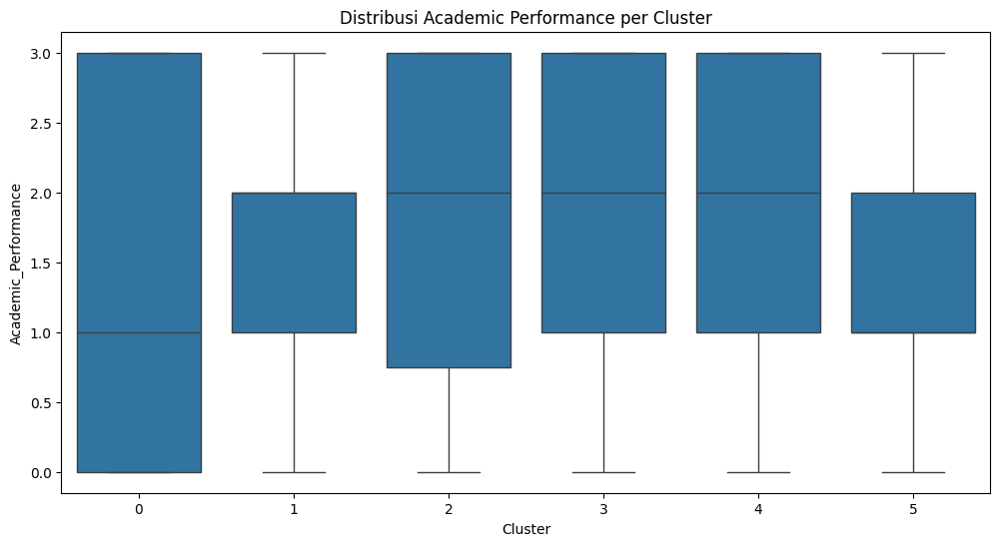

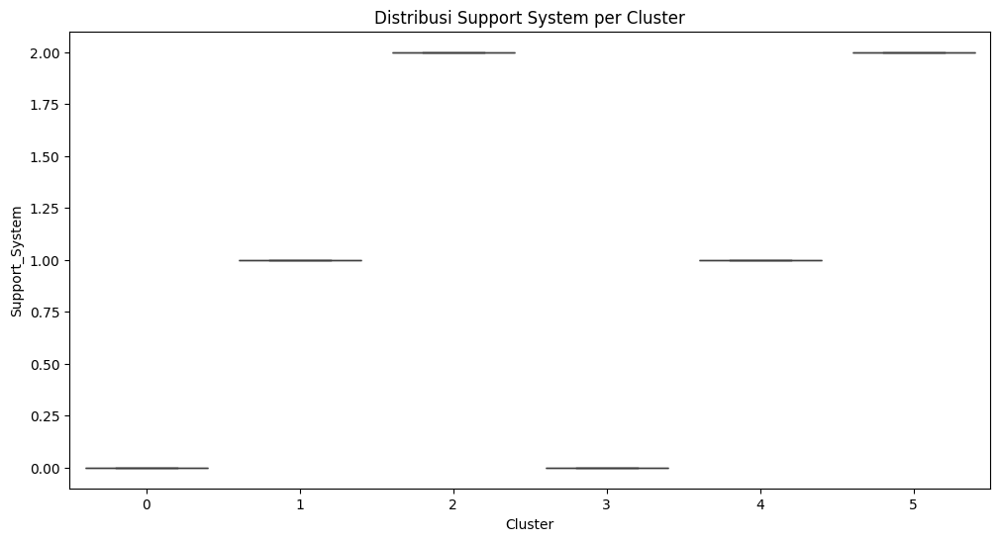

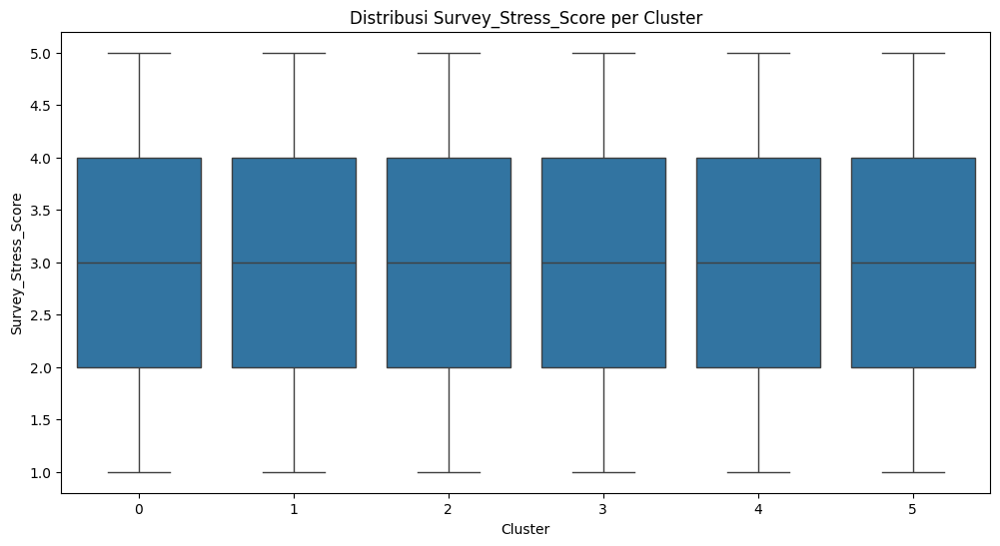

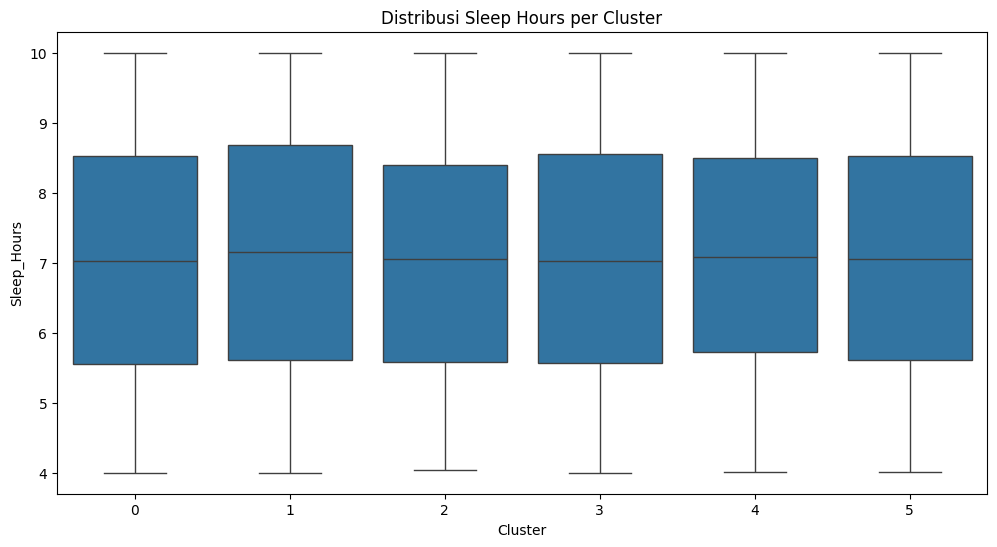

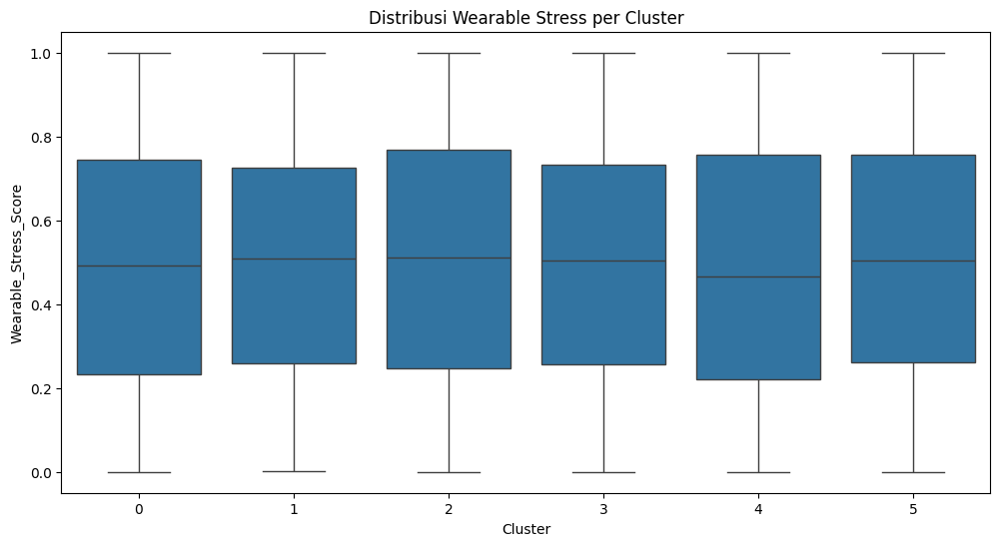

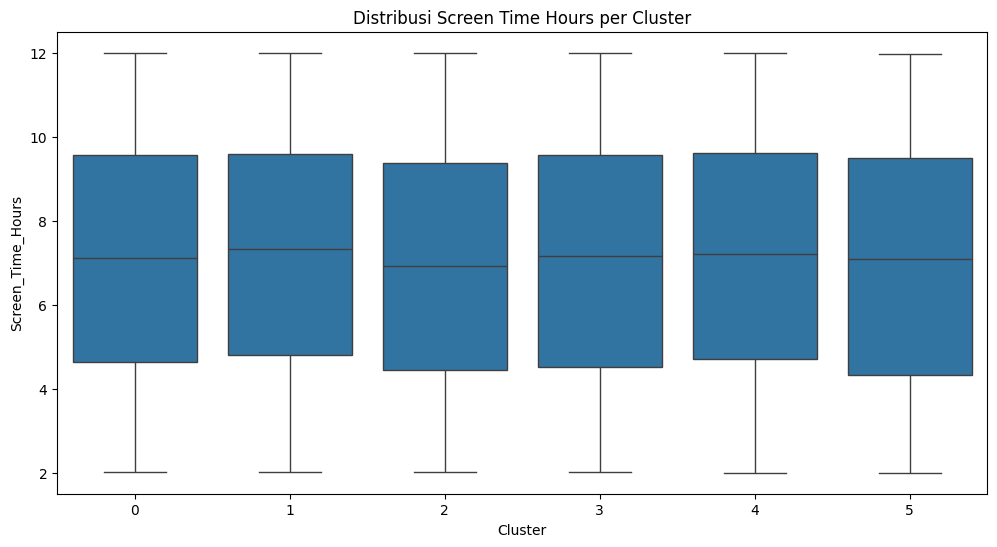

In [410]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualisasi distribusi fitur berdasarkan cluster
plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Academic_Performance', data=df)
plt.title('Distribusi Academic Performance per Cluster')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Support_System', data=df)
plt.title('Distribusi Support System per Cluster')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Survey_Stress_Score', data=df)
plt.title('Distribusi Survey_Stress_Score per Cluster')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Sleep_Hours', data=df)
plt.title('Distribusi Sleep Hours per Cluster')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Wearable_Stress_Score', data=df)
plt.title('Distribusi Wearable Stress per Cluster')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Screen_Time_Hours', data=df)
plt.title('Distribusi Screen Time Hours per Cluster')
plt.show()

Tulis hasil interpretasinya di sini.
1. Cluster 1:
- **Rata-rata Survey Stress Score:** 4.0
- **Rata-rata Wearable Stress Score:** 0.75
- **Support System:** Rendah
- **Academic Performance:** Tinggi
- **Analisis:** Kelompok ini terdiri dari individu yang memiliki screen time yang tinggi dan tingkat stres yang paling tinggi. Jam tidur mereka juga lebih rendah dibandingkan kelompok lain. Meskipun memiliki performa akademik yang cukup baik, rendahnya dukungan sosial bisa menjadi faktor yang memperburuk stres mereka.
     
3. Cluster 2:
- **Rata-rata Survey Stress Score:** 4.0
- **Rata-rata Wearable Stress Score:** 0.45
- **Support System:** Sedang - Tinggi
- **Academic Performance:** Sedang
- **Analisis:** Individu dalam cluster ini memiliki pola tidur yang cukup, screen time yang sedang, serta tingkat stres yang lebih rendah dibandingkan cluster lain. Dukungan sosial mereka cukup baik, yang mungkin membantu menjaga keseimbangan antara studi dan kehidupan pribadi.
   
5. Cluster 3:
- **Rata-rata Survey Stress Score:** 4.0
- **Rata-rata Wearable Stress Score:** 0.3
- **Support System:** Tinggi
- **Academic Performance:** Tinggi
- **Analisis:** Kelompok ini terdiri dari individu dengan tingkat stres paling rendah, screen time yang lebih sedikit, dan performa akademik yang sangat baik. Mereka juga memiliki dukungan sosial yang tinggi, yang mungkin menjadi faktor utama dalam membantu mereka tetap stabil.

# Contoh interpretasi [TEMPLATE]
# Analisis Karakteristik Cluster dari Model KMeans

Berikut adalah analisis karakteristik untuk setiap cluster yang dihasilkan dari model KMeans.

## Cluster 1:
- **Rata-rata Annual Income (k$):** 48,260  
- **Rata-rata Spending Score (1-100):** 56.48  
- **Analisis:** Cluster ini mencakup pelanggan dengan pendapatan tahunan menengah dan tingkat pengeluaran yang cukup tinggi. Pelanggan dalam cluster ini cenderung memiliki daya beli yang moderat dan mereka lebih cenderung untuk membelanjakan sebagian besar pendapatan mereka.

## Cluster 2:
- **Rata-rata Annual Income (k$):** 86,540  
- **Rata-rata Spending Score (1-100):** 82.13  
- **Analisis:** Cluster ini menunjukkan pelanggan dengan pendapatan tahunan tinggi dan pengeluaran yang sangat tinggi. Pelanggan di cluster ini merupakan kelompok premium dengan daya beli yang kuat dan cenderung mengeluarkan uang dalam jumlah besar untuk produk atau layanan.

## Cluster 3:
- **Rata-rata Annual Income (k$):** 87,000  
- **Rata-rata Spending Score (1-100):** 18.63  
- **Analisis:** Cluster ini terdiri dari pelanggan dengan pendapatan tahunan yang tinggi tetapi pengeluaran yang rendah. Mereka mungkin memiliki kapasitas finansial yang baik namun tidak terlalu aktif dalam berbelanja. Ini bisa menunjukkan bahwa mereka lebih selektif dalam pengeluaran mereka atau mungkin lebih cenderung untuk menyimpan uang.

# **7. Mengeksport Data**

Simpan hasilnya ke dalam file CSV.

In [411]:
# Ekspor data hasil clustering ke CSV
df.to_csv("dataset_clustering.csv", index=False)

print("Data hasil clustering telah diekspor ke 'dataset_clustering.csv'.")


Data hasil clustering telah diekspor ke 'dataset_clustering.csv'.
